In [10]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import pandas as pd
import numpy as np
import seaborn as sns
import joblib
import matplotlib as plt

from sklearn.metrics import classification_report, plot_confusion_matrix, plot_roc_curve, accuracy_score, confusion_matrix

In [11]:
import sys

gdrive_project_root = '../' 
is_cloud = False

if 'google.colab' in sys.modules:
    is_cloud = True
    from google.colab import drive
    # define project root / change to match your path
    path_mv = "drive/MyDrive/01-Education/03-PhD/2021/Courses/HCI/hci_code/"
    path_mg = "drive/MyDrive/HCI/hci_code/"
    path_nj = ""

    # change to your private path
    gdrive_project_root = path_mv
    drive.mount('/content/drive', force_remount=True)  

In [12]:
X = pd.read_csv(gdrive_project_root  + 'data/processed/2nd_dataset/3_cls_model_input/X_3cls.csv')
y = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/y_3cls.csv')
X_train = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/X_train_3cls.csv')
X_test = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/X_test_3cls.csv')
y_train = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/y_train_3cls.csv')
y_test = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/y_test_3cls.csv')

In [13]:
clf = joblib.load(gdrive_project_root + 'models/CLF_3classes_GBM-AASTR-ODG_RandomForest_100estimators_42_random_state.pkl')

/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 0.22.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator RandomForestClassifier from version 0.22.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(


In [5]:
predictions = clf.predict(X_test)
print("Model accuracy: %s \n" % accuracy_score(y_test, predictions))
print(classification_report(y_test, predictions))

Model accuracy: 0.76953125 

              precision    recall  f1-score   support

           1       0.83      0.94      0.88       177
           2       0.48      0.29      0.36        45
           3       0.64      0.53      0.58        34

    accuracy                           0.77       256
   macro avg       0.65      0.59      0.61       256
weighted avg       0.74      0.77      0.75       256



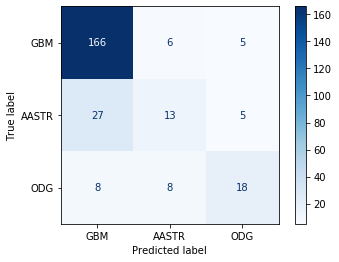

In [6]:
plot_confusion_matrix(clf, X_test, y_test, cmap = plt.cm.Blues, display_labels=["GBM", "AASTR", "ODG"], values_format = '')


# Nikolina



#### interpret installed




In [21]:
if is_cloud:
    !{sys.executable} -m pip install interpret

In [ ]:
# from interpret import set_visualize_provider
# from interpret.provider import InlineProvider
# set_visualize_provider(InlineProvider())

# from interpret import show
# from interpret.blackbox import ShapKernel

#### SHAP 

In [ ]:
shap = ShapKernel(predict_fn=clf.predict_proba, data=X_train)
shap_local = shap.explain_local(X_test[:5], y_test[:5])

show(shap_local)

NameError: ignored

In [ ]:
show(shap_local)


#### gamma-facet installed

-->  The SHAP implementation by Scott Lundberg is used to estimate the SHAP vectors being decomposed into the synergy, redundancy, and independence vectors.

It looks that we cant estimate SHAP directly, but they use the SHAP values for the FACET approach

In [ ]:
from facet.data import Sample
from facet.selection import LearnerRanker, LearnerGrid

ModuleNotFoundError: ignored

#### dalex installed

In [ ]:
if is_cloud:
    !{sys.executable} -m pip install dalex

     |████████████████████████████████| 976 kB 7.2 MB/s 
     |████████████████████████████████| 23.9 MB 13 kB/s 
  Created wheel for dalex: filename=dalex-1.3.0-py3-none-any.whl size=996187 sha256=3368f5a19bf02fcf8c7c5f2c47c6743db817223158325ab3e39353c3965e30b2
  Stored in directory: /root/.cache/pip/wheels/a7/ca/f5/fb963128cd97070f73e592622580506901776acafe0effd708
Successfully built dalex
  Attempting uninstall: plotly
    Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [32]:
import dalex as dx

ModuleNotFoundError: No module named 'dalex'

In [ ]:
exp = dx.Explainer(clf, X_train, y_train, label = "Random Forest")

Preparation of a new explainer is initiated

  -> data              : 343 rows 9 cols
  -> target variable   : Parameter 'y' was a pandas.DataFrame. Converted to a numpy.ndarray.
  -> target variable   : 343 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Random Forest
  -> predict function  : <function yhat_proba_default at 0x7ff76f7e3710> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.354, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = 0.645, mean = 1.48, max = 3.0
  -> model_info        : package sklearn

A new explainer has been created!


In [ ]:
shap = exp.predict_parts(X_test, type = 'shap', B = 10)
shap.plot(max_vars=5)

ValueError: ignored

# Milot

#### explainx installed

In [ ]:
if is_cloud:
    !{sys.executable} -m pip install explainx

     |████████████████████████████████| 792 kB 14.9 MB/s 
     |████████████████████████████████| 45 kB 1.3 MB/s 
     |████████████████████████████████| 107 kB 35.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 66 kB 4.0 MB/s 
     |████████████████████████████████| 3.4 MB 47.4 MB/s 
     |████████████████████████████████| 187 kB 68.0 MB/s 
     |████████████████████████████████| 7.1 MB 12.6 MB/s 
     |████████████████████████████████| 1.8 MB 44.7 MB/s 
     |████████████████████████████████| 10.1 MB 47.2 MB/s 
     |████████████████████████████████| 20.1 MB 1.4 MB/s 
     |████████████████████████████████| 11.6 MB 23.7 MB/s 
     |████████████████████████████████| 7.0 MB 44.1 MB/s 
     |████████████████████████████████| 66 kB 5.3 MB/s 
     |████████████████████████████████| 264 kB 52.2 MB/s 
     |████████████████████████████████| 642 kB 47.2 MB/s 
     |██

In [ ]:
from explainx import * 

In [ ]:
X_test.shape

(86, 9)

In [ ]:
y_test.shape

(86, 1)

In [ ]:
explainx.ai(X_train, y_train, clf, model_name = "Random Forest")

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_

IndexError: ignored

In [ ]:
explainx_modules.ai(clf, X_test, y_test)

In [ ]:
explainx_modules.shap_df()

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


AttributeError: ignored

#### Eli5 installed



#### SHAP installed


In [37]:
import shap 

In [38]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(clf)

# Calculate Shap values
shap_values = explainer.shap_values(X_test)

In [39]:
shap.initjs()

shap.force_plot(explainer.expected_value[1], shap_values[1], X_test)

In [ ]:

from sklearn.ensemble import RandomForestClassifier

#rf = RandomForestClassifier(n_estimators=30, max_depth=20, random_state=0, max_features='sqrt',\
#                            class_weight='balanced')
#rf.fit(X_train, y_train)

# use Kernel SHAP to explain test set predictions
explainer = shap.KernelExplainer(clf.predict_proba, X_train, link="logit")
shap_values = explainer.shap_values(X_test)

# plot the SHAP values for the Setosa output of the first instance
#shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], X_test.iloc[0,:], link="logit")

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
divide by zero encountered in log
invalid value encountered in multiply
invalid value encountered in subtract
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
divide by zero encountered in log
invalid value encountered in multiply
invalid value encountered in subtract
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
l1_reg="auto" is deprecated and in the next version (v0

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], X_test.iloc[0,:], link="logit")

# Matej

#### AIX360 installed


In [ ]:
if is_cloud:
    !{sys.executable} -m pip install aix360

In [ ]:
import aix360

ModuleNotFoundError: ignored

####  ALIBI installed altogether with SHAP

In [ ]:
if is_cloud:
    !{sys.executable} -m pip install alibi

     |████████████████████████████████| 387 kB 9.7 MB/s 
     |████████████████████████████████| 2.9 MB 70.1 MB/s 
     |████████████████████████████████| 28.0 MB 65 kB/s 
ERROR: Operation cancelled by user


In [ ]:
if is_cloud:
    !{sys.executable} -m pip install alibi[shap]

In [ ]:

import alibi

ModuleNotFoundError: ignored

In [ ]:
from alibi.explainers.shap_wrappers import KernelShap

predict_fn = lambda x: clf.predict_proba(x)
explainer = KernelShap(predict_fn, link='logit', feature_names=list(X_train.columns))

In [ ]:
explainer.fit(X_train)



In [ ]:
explanation = explainer.explain(X_test )

In [ ]:
shap.force_plot(
    svm_explainer.expected_value[class_idx],
    svm_explanation.shap_values[class_idx][idx, :] ,
    instance,
    feature_names,
)
# X_test

In [ ]:
import shap 

shap.initjs()
shap.force_plot(explainer.expected_value[0], explanation.shap_values[0][0,:], X_test.iloc[5,:], link="logit")


## Install Dalex


In [13]:
if is_cloud:
    !{sys.executable} -m pip install dalex --user


  Using cached https://files.pythonhosted.org/packages/9b/11/36a9e8aac048c368ad57ab397f7d5030d7bbd1a9d4e4bf95527f9d0c9d2f/dalex-1.4.0.tar.gz
  Using cached https://files.pythonhosted.org/packages/58/58/b729eda34f78060e14cb430c91d4f7ba3cf1e34797976877a3a1125ea5b2/pandas-1.3.4.tar.gz
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Using cached https://files.pythonhosted.org/packages/56/0e/85fb62699fa41d980763df35e05d60e53759c1c554f586962df378a7eae1/numpy-1.21.3-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/68/b2/7c7d111affebb281b1085680db7358f6204920bb5574e9e84db05c530688/plotly-5.3.1-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/63/f3/b7a1b8e40fd1bd049a34566eb353527bb9b8e9b98f8b6cf803bb64d8ce95/tqdm-4.62.3-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/b5/6b/8bc0b61ebf824f8c3979a31368

In [15]:
%load_ext autoreload
%autoreload 2

In [7]:
import dalex as dx

In [8]:
exp = dx.Explainer(clf, X, y)


Preparation of a new explainer is initiated

  -> data              : 1276 rows 252 cols
  -> target variable   : Parameter 'y' was a pandas.DataFrame. Converted to a numpy.ndarray.
  -> target variable   : 1276 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f7a36d18f70> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.187, max = 0.98
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = 0.43, mean = 1.26, max = 3.0
  -> model_info        : package sklearn

A new explainer has been created!


In [9]:
vi = exp.model_parts()

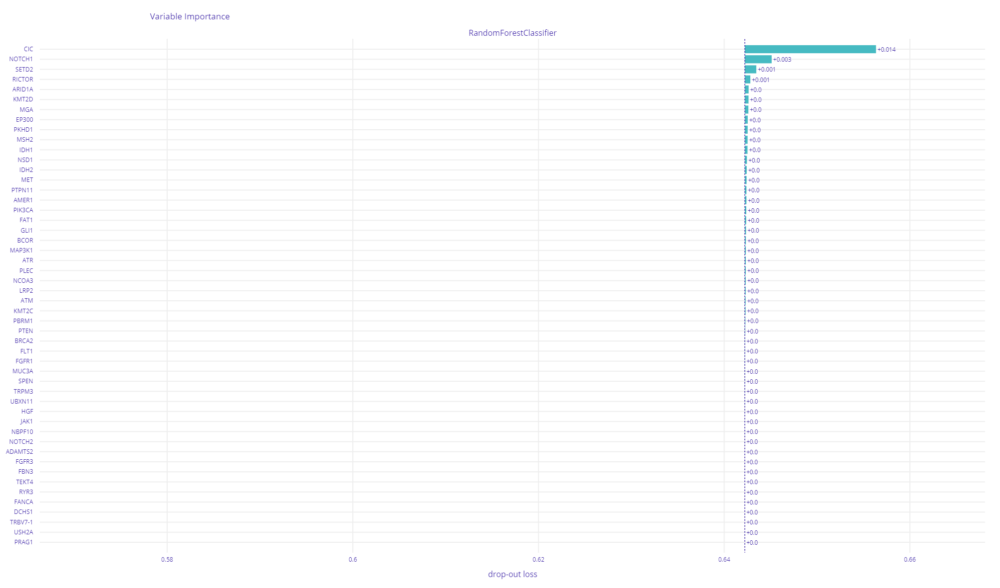

In [13]:
vi.plot(max_vars=50)


In [17]:
vi2 = exp.model_parts(B=50, processes=12)

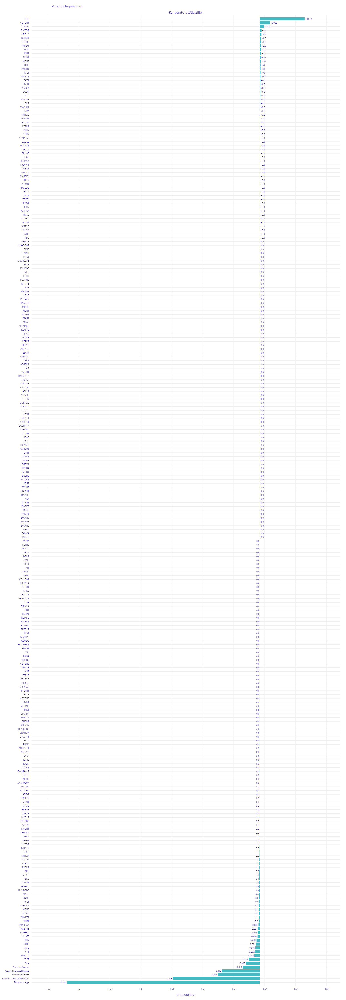

In [19]:
vi2.plot(max_vars=252)


In [12]:
ratio = exp.model_parts(type='ratio')

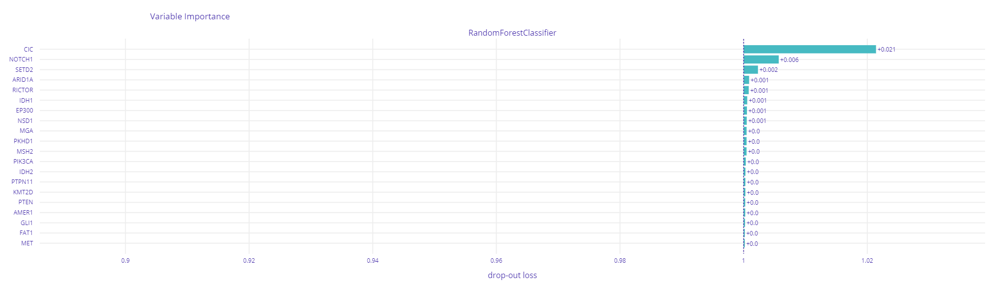

In [14]:
ratio.plot(max_vars=20)


In [15]:
difference = exp.model_parts(type='difference')

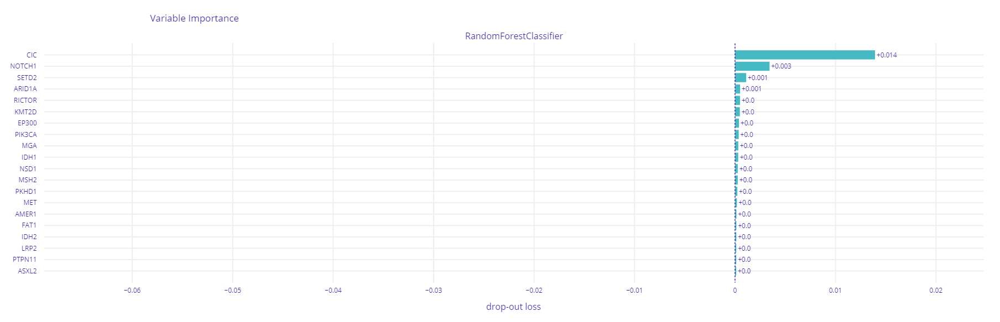

In [16]:
difference.plot(max_vars=20)


In [11]:
ebm_global = ebm.explain_global()
show(ebm_global)

NameError: name 'ebm' is not defined

### ELI5


In [8]:
if is_cloud:
    !{sys.executable} install eli5


In [9]:
import eli5
eli5.show_weights(clf)

Weight,Feature
0.3212 ± 0.0971,x2
0.2857 ± 0.0972,x5
0.1681 ± 0.0527,x1
0.0375 ± 0.0254,x0
0.0250 ± 0.0249,x3
0.0249 ± 0.0231,x14
0.0201 ± 0.0145,x6
0.0149 ± 0.0157,x4
0.0091 ± 0.0109,x9
0.0081 ± 0.0091,x13


In [10]:
eli5.explain_weights(clf)

Weight,Feature
0.3212 ± 0.0971,x2
0.2857 ± 0.0972,x5
0.1681 ± 0.0527,x1
0.0375 ± 0.0254,x0
0.0250 ± 0.0249,x3
0.0249 ± 0.0231,x14
0.0201 ± 0.0145,x6
0.0149 ± 0.0157,x4
0.0091 ± 0.0109,x9
0.0081 ± 0.0091,x13


In [11]:
eli5.show_weights(clf,
                  feature_names=X_train.columns.to_list(),
                  target_names=y.columns.to_list(), top=9)


# ‘targets’ - per-target feature weights;
# ‘transition_features’ - transition features of a CRF model;
# ‘feature_importances’ - feature importances of a decision tree or an ensemble-based estimator;
# ‘decision_tree’ - decision tree in a graphical form;
# ‘method’ - a string with explanation method;
# ‘description’ - description of explanation method and its caveats.

In [12]:
eli5.show_weights(clf,
                  feature_names=X_train.columns.to_list(),
                  target_names=y.columns.to_list(), top=252)


# ‘targets’ - per-target feature weights;
# ‘transition_features’ - transition features of a CRF model;
# ‘feature_importances’ - feature importances of a decision tree or an ensemble-based estimator;
# ‘decision_tree’ - decision tree in a graphical form;
# ‘method’ - a string with explanation method;
# ‘description’ - description of explanation method and its caveats.

Weight,Feature
0.3212 ± 0.0971,Overall Survival (Months)
0.2857 ± 0.0972,Diagnosis Age
0.1681 ± 0.0527,Mutation Count
0.0375 ± 0.0254,Overall Survival Status
0.0250 ± 0.0249,Sex
0.0249 ± 0.0231,CIC
0.0201 ± 0.0145,TP53
0.0149 ± 0.0157,Somatic Status
0.0091 ± 0.0109,ATRX
0.0081 ± 0.0091,EGFR


In [13]:
eli5.show_weights(clf,
                  feature_names=X_train.columns.to_list(),
                  target_names=y.columns.to_list(), show='decision_tree')


# ‘targets’ - per-target feature weights;
# ‘transition_features’ - transition features of a CRF model;
# ‘feature_importances’ - feature importances of a decision tree or an ensemble-based estimator;
# ‘decision_tree’ - decision tree in a graphical form;
# ‘method’ - a string with explanation method;
# ‘description’ - description of explanation method and its caveats.

### InterpretML
---
Glassbox model

In [10]:
if is_cloud:
    !{sys.executable} -m pip install interpret


  Using cached https://files.pythonhosted.org/packages/f6/95/ff4447375559638520567a0bf6e9853535c01e641061c74132d809f6ea6c/interpret-0.2.7-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/1c/23/057c891f6a0688c5d90bd7364896fe44af8da19f84f6e2e855e4833dc242/interpret_core-0.2.7-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/34/be/21ee645cb7943ab71b08e32c90c26c71d3d03f08e5a52c50e6e76568f0a0/dash_cytoscape-0.3.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/04/09/bcbe4b907c6d987ea66416178475c6049c9ab7b56135c3725b2e01e3c9e8/SALib-1.4.5-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/b6/c3/973676ceb86b60835bb3978c6db67a5dc06be6cfdbd14ef0f5a13e3fc9fd/dill-0.3.4-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/3f/5b/d3ea2e1635601557945c0a166b206b0b6e8b284cb74cb4bdb1b423ec7dd4/skope_rules-1.0.1-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/af/1

In [41]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

In [42]:
import pandas as pd
from sklearn.model_selection import train_test_split

from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show


ebm = ExplainableBoostingClassifier(random_state=42)
ebm.fit(X_train, y_train)

ebm_global = ebm.explain_global()
show(ebm_global)

ebm_local = ebm.explain_local(X_test[:5], y_test[:5], )
show(ebm_local)

/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/interpret/glassbox/ebm/ebm.py:922: UserWarning:

Multiclass is still experimental. Subject to change per release.

/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/interpret/glassbox/ebm/ebm.py:925: UserWarning:

Detected multiclass problem: forcing interactions to 0



### ExplainX
---
Only relevant thing to feature importances found were the global shapely values. Let's check if they are acutally what we are looking for. 



In [ ]:
if is_cloud:
    !{sys.executable} install explainx

     |████████████████████████████████| 792 kB 4.8 MB/s 
     |████████████████████████████████| 45 kB 2.2 MB/s 
     |████████████████████████████████| 107 kB 72.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 66 kB 4.0 MB/s 
     |████████████████████████████████| 3.4 MB 36.9 MB/s 
     |████████████████████████████████| 187 kB 54.6 MB/s 
     |████████████████████████████████| 7.1 MB 9.8 MB/s 
     |████████████████████████████████| 1.8 MB 31.8 MB/s 
     |████████████████████████████████| 10.1 MB 31.5 MB/s 
     |████████████████████████████████| 20.1 MB 120 kB/s 
     |████████████████████████████████| 11.6 MB 31.6 MB/s 
     |████████████████████████████████| 7.0 MB 48.2 MB/s 
     |████████████████████████████████| 66 kB 4.1 MB/s 
     |████████████████████████████████| 264 kB 53.2 MB/s 
     |████████████████████████████████| 642 kB 37.3 MB/s 
     |████

In [ ]:
explainx_modules.shap_df()

NameError: ignored

### SHAP


In [ ]:
if is_cloud:
    !{sys.executable} install shap


     |████████████████████████████████| 356 kB 29.9 MB/s eta 0:00:01
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491649 sha256=c5a3f631db6e118f6f63f96a0129cead74e966c205214da748204b4c4e70b963
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap


In [7]:
import shap


In [8]:
# summarize the effects of all the features
# Create object that can calculate shap values
explainer = shap.TreeExplainer(clf)

# Calculate Shap values
shap_values = explainer.shap_values(X_test)

In [9]:
shap.initjs()


In [10]:
shap_obj = explainer(X)

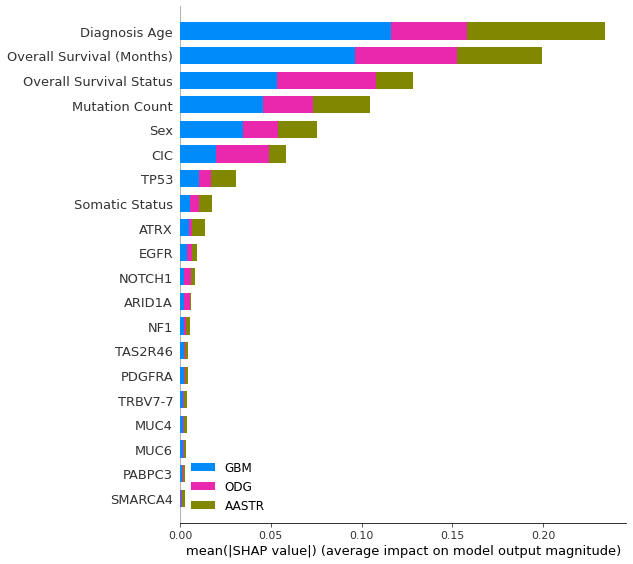

In [19]:
shap.summary_plot(shap_values, features=X, feature_names=X.columns, class_names=["GBM", "AASTR", "ODG"])


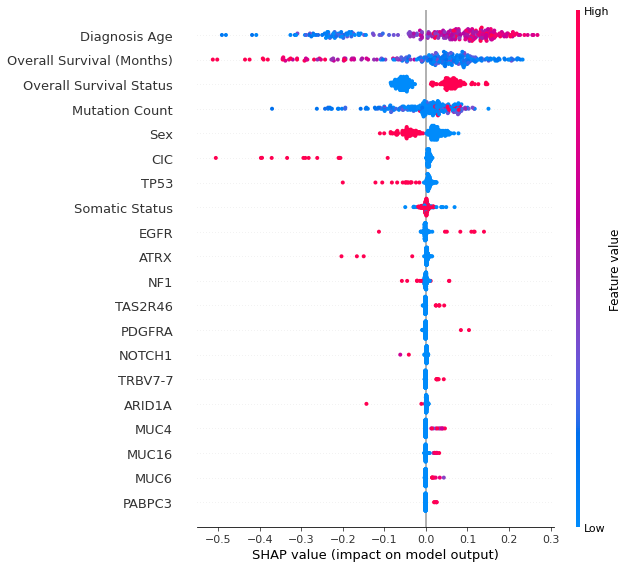

In [28]:
shap.initjs()

# shap.summary_plot(explainer.expected_value[1], shap_values[1], X)
shap_values1 = explainer.shap_values(X_test, approximate=True)
shap.summary_plot(shap_values1[0], X_test, class_names=["GBM", "AASTR", "ODG"])

# Explainx

In [ ]:
from explainx import *


In [ ]:
explainx.ai(X_test, y_test, clf, model_name="randomforest")

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


IndexError: list index out of range